In [62]:
synthetic_data_path = "C:/Users/solom/Desktop/AliceBob25/github/eth25_alice-bob_challenge/data/synthetic"
experimental_data_path = "C:/Users/solom/Desktop/AliceBob25/github/eth25_alice-bob_challenge/data/experimental"

import numpy as np
import pickle
import matplotlib.pyplot as plt
import scipy
import sklearn
import jax.numpy as jnp
import dynamiqs as dq
from scipy.ndimage import gaussian_filter
from skimage.metrics import structural_similarity as ssim


from matplotlib.animation import FuncAnimation
from PIL import Image
import imageio
import os

results_path = "C:/Users/solom/Desktop/AliceBob25/"

## 2. Advanced Exploration - Denoising

In [42]:
def denoise_wigner(W, sigma=1.0):
    """
    Apply Gaussian denoising to a Wigner function.
    
    Parameters:
        W (ndarray): Input Wigner function (2D array)
        sigma (float): Standard deviation of Gaussian kernel (controls blur strength)
        truncate (float): Truncate the filter at this many standard deviations
        
    Returns:
        ndarray: Denoised Wigner function
    """
    # Apply Gaussian filter
    W_denoised = gaussian_filter(W, sigma=sigma)
    
    # Renormalize to maintain similar scale
    W_denoised = W_denoised * (np.sum(W) / np.sum(W_denoised))
    
    return W_denoised

def wigner_fidelity_jax(W1, W2, dx, dp):
    sqrt_product = jnp.sqrt(jnp.abs(W1 * W2))
    integral = jnp.sum(sqrt_product) * dx * dp
    return integral ** 2

def normalize_wigner(W, dx, dp):
    return W / (np.sum(W) * dx * dp)

def kl_divergence(W_true, W_denoised, dx, dp, eps=1e-12):
    W_true = W_true + eps
    W_denoised = W_denoised + eps
    return np.sum(W_true * np.log(W_true / W_denoised)) * dx * dp


In [43]:
with open(synthetic_data_path + "/noisy_wigner_0.pickle", 'rb') as read:
	wigner_function0 = pickle.load(read)

In [45]:
def calculate_metrics(W, W_denoised):
    # Signal-to-Noise Ratio (higher is better)
    signal_power = np.mean(W**2)
    noise_power = np.mean((W - W_denoised)**2)
    snr = 10 * np.log10(signal_power / noise_power)
    
    # Structural Similarity (range [-1,1], closer to 1 is better)
    from skimage.metrics import structural_similarity as ssim
    ssim_val = ssim(W, W_denoised, data_range=W.max()-W.min())
    
    # Feature correlation
    correlation = np.corrcoef(W.ravel(), W_denoised.ravel())[0,1]
    
    return {'SNR (dB)': snr, 'SSIM': ssim_val, 'Correlation': correlation}

In [58]:

from scipy.ndimage import zoom

def resample_to_match(W_source, target_shape):
    """Resample W_source to the shape of W_target using interpolation."""
    zoom_factors = (target_shape[0] / W_source.shape[0], target_shape[1] / W_source.shape[1])
    return zoom(W_source, zoom_factors, order=1)  # linear interpolation


for i, sigma in enumerate(sigmas):
    print(f"Sigma: {sigma:.2f}")
    
    W_denoised = denoise_wigner(W, sigma=sigma)
    W_resampled = resample_to_match(W_denoised, W_true.shape)  # <- move this here!

    dx=xvec[1]-xvec[0]
    dp=yvec[1]-yvec[0]
    W_true = normalize_wigner(W_true, dx, dp)
    W_resampled = normalize_wigner(W_resampled, dx, dp)
    
    # Calculate kl divergence
    kl_div = kl_divergence(W_true, W_resampled, dx, dp)
    print(f"KL Divergence: {kl_div:.4f}")


Sigma: 0.01
KL Divergence: 3.5379
Sigma: 1.51
KL Divergence: 3.5344
Sigma: 3.01
KL Divergence: 3.5336
Sigma: 4.51
KL Divergence: 3.5330
Sigma: 6.00
KL Divergence: 3.5324
Sigma: 7.50
KL Divergence: 3.5317
Sigma: 9.00
KL Divergence: 3.5310
Sigma: 10.50
KL Divergence: 3.5304
Sigma: 12.00
KL Divergence: 3.5298


C:\Users\solom\AppData\Local\Temp\ipykernel_16256\928640610.py:5: RuntimeWarning: divide by zero encountered in scalar divide
  snr = 10 * np.log10(signal_power / noise_power)


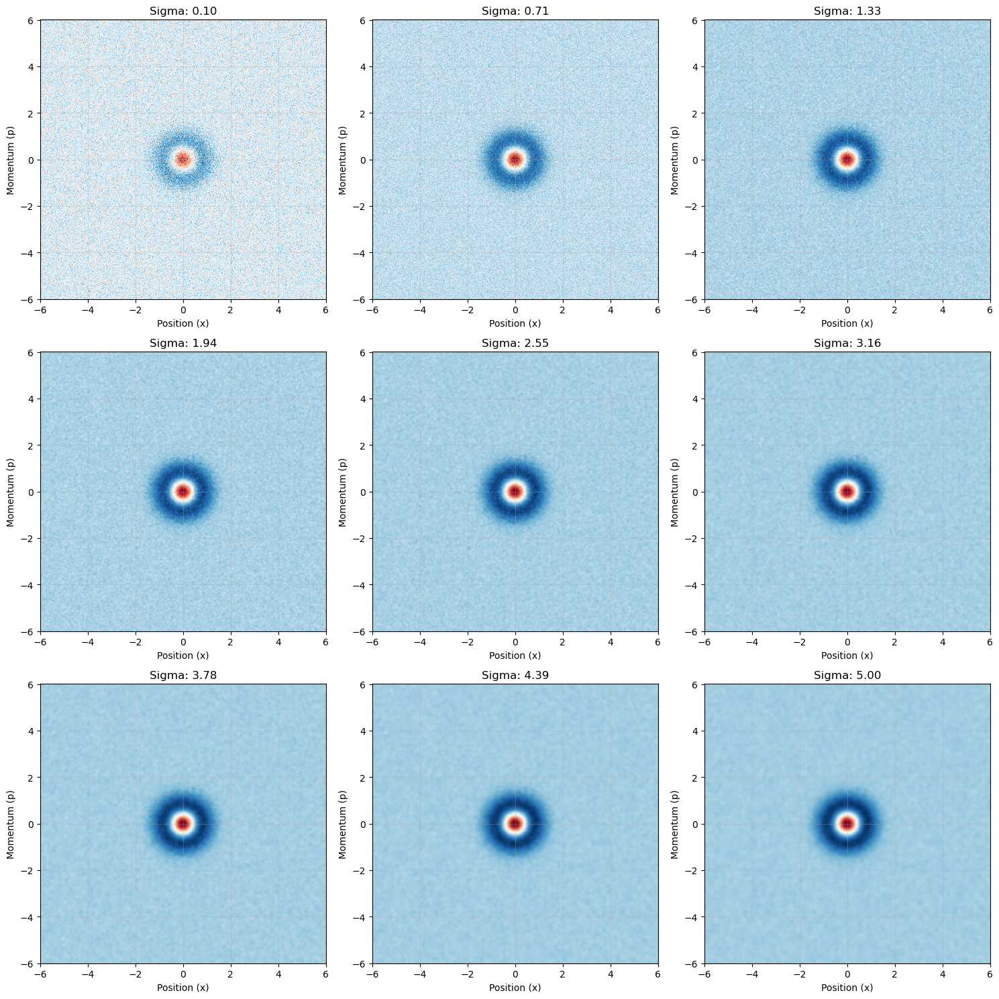

In [54]:
with open(synthetic_data_path + "/noisy_wigner_1.pickle", 'rb') as read:
	wigner_function1 = pickle.load(read)
	
xvec, yvec, W = wigner_function1

# Create meshgrid for plotting
X, Y = np.meshgrid(xvec, yvec)

#create 3 by 3 grid of denoised wigner functions for different sigmas
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
sigmas = np.linspace(0.1, 5, 9)
for i, sigma in enumerate(sigmas):
    W_denoised = denoise_wigner(W, sigma=sigma)  # Adjust sigma for desired smoothing
    metrics = calculate_metrics(W, W_denoised)
    ax = axs[i // 3, i % 3]
    ax.pcolormesh(X, Y, W_denoised, shading='auto', cmap='RdBu')  # Using diverging colormap
    ax.set_title(f'Sigma: {sigma:.2f}')
    ax.set_xlabel('Position (x)')
    ax.set_ylabel('Momentum (p)')
    ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

C:\Users\solom\AppData\Local\Temp\ipykernel_16256\928640610.py:5: RuntimeWarning: divide by zero encountered in scalar divide
  snr = 10 * np.log10(signal_power / noise_power)


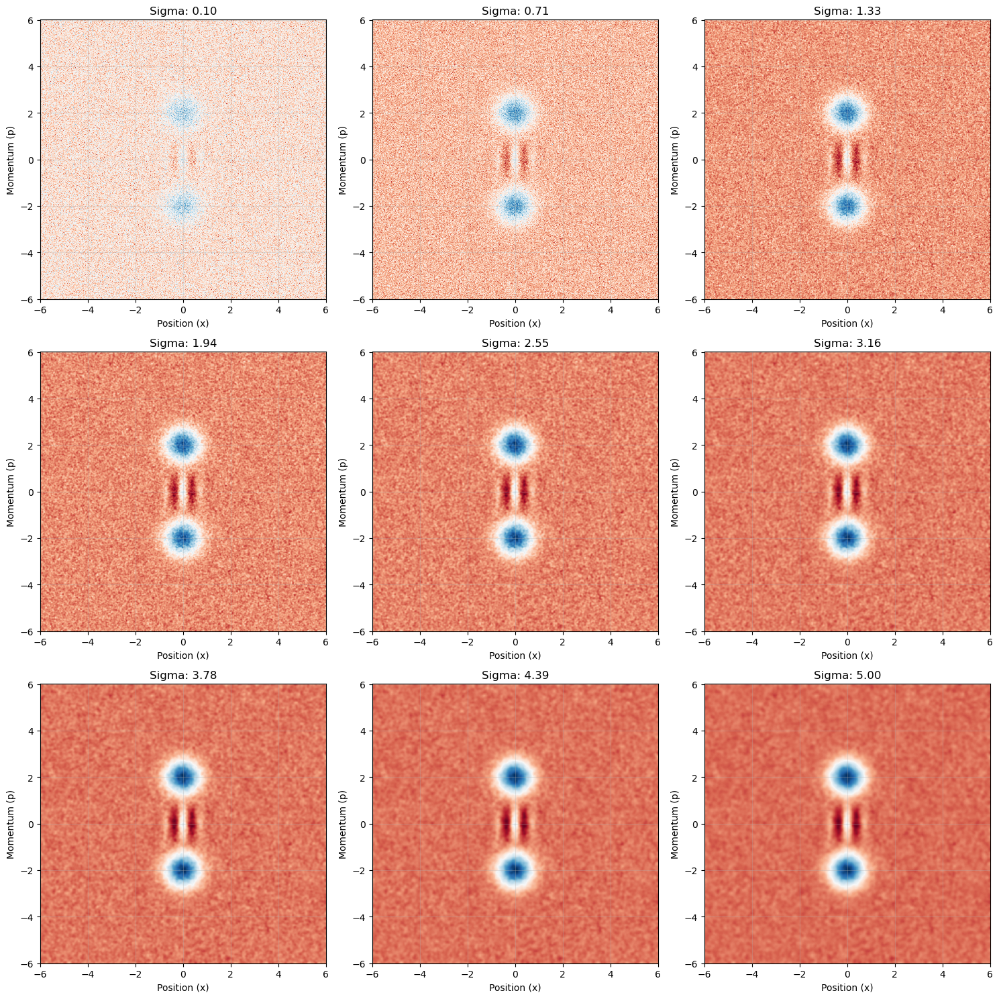

In [55]:
with open(synthetic_data_path + "/noisy_wigner_2.pickle", 'rb') as read:
	wigner_function2 = pickle.load(read)
	
xvec, yvec, W = wigner_function2

# Create meshgrid for plotting
X, Y = np.meshgrid(xvec, yvec)

#create 3 by 3 grid of denoised wigner functions for different sigmas
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
sigmas = np.linspace(0.1, 5, 9)
for i, sigma in enumerate(sigmas):
    W_denoised = denoise_wigner(W, sigma=sigma)  # Adjust sigma for desired smoothing
    metrics = calculate_metrics(W, W_denoised)
    ax = axs[i // 3, i % 3]
    ax.pcolormesh(X, Y, W_denoised, shading='auto', cmap='RdBu')  # Using diverging colormap
    ax.set_title(f'Sigma: {sigma:.2f}')
    ax.set_xlabel('Position (x)')
    ax.set_ylabel('Momentum (p)')
    ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
noisy_data_number = 2
with open(synthetic_data_path + "/noisy_wigner_" + str(noisy_data_number) + ".pickle", 'rb') as read:
	wigner_function = pickle.load(read)
with open(synthetic_data_path + "/quantum_state_" + str(noisy_data_number) + ".pickle", 'rb') as read:
	quantum_state = pickle.load(read)
     
xvec, yvec, W = wigner_function
xvec_true, yvec_true, W_true = dq.wigner(quantum_state)

def plot_denoised_wigners(W, xvec, yvec, sigmas):
    # Create meshgrid for plotting
    X, Y = np.meshgrid(xvec, yvec)

    #create 3 by 3 grid of denoised wigner functions for different sigmas
    fig, axs = plt.subplots(3, 3, figsize=(15, 15))
    sigmas = np.linspace(0.1, 5, 9)
    for i, sigma in enumerate(sigmas):
        W_denoised = denoise_wigner(W, sigma=sigma)  # Adjust sigma for desired smoothing
        ax = axs[i // 3, i % 3]
        ax.pcolormesh(X, Y, W_denoised, shading='auto', cmap='RdBu')  # Using diverging colormap
        ax.set_title(f'Sigma: {sigma:.2f}')
        ax.set_xlabel('Position (x)')
        ax.set_ylabel('Momentum (p)')
        ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def estimate_b(W, edge_width=10):
    edges = np.concatenate([
        W[:edge_width, :].ravel(),
        W[-edge_width:, :].ravel(),
        W[:, :edge_width].ravel(),
        W[:, -edge_width:].ravel()
    ])
    return np.mean(edges)

def estimate_a(W, b, dx, dp):
    return np.sum(W - b) * dx * dp

def correct_affine(W, dx, dp):
    b = estimate_b(W)
    a = estimate_a(W, b, dx, dp)
    return (W - b) / a

# --- 2. Fidelity metric ---

def wigner_fidelity(W1, W2, dx, dp):
    sqrt_product = np.sqrt(np.abs(W1 * W2))
    return (np.sum(sqrt_product) * dx * dp) ** 2

# --- 3. Optional: resample to match shapes ---

def resample_to_match(W_source, target_shape):
    zoom_factors = (target_shape[0] / W_source.shape[0], target_shape[1] / W_source.shape[1])
    return zoom(W_source, zoom_factors, order=1)

# --- 4. SSIM wrapper ---

def ssim_score(W1, W2):
    return ssim(W1, W2, data_range=W1.max() - W1.min())

# --- 5. Batch evaluation loop ---

def process_wigner_batch(noisy_list, clean_list, xvec, pvec):
    dx = xvec[1] - xvec[0]
    dp = pvec[1] - pvec[0]

    for i, (W_noisy, W_clean) in enumerate(zip(noisy_list, clean_list)):
        # Step 1: Correct affine
        W_corr = correct_affine(W_noisy, dx, dp)

        # Step 2: Resample if needed
        if W_corr.shape != W_clean.shape:
            W_corr = resample_to_match(W_corr, W_clean.shape)

        # Step 3: Normalize both (optional but improves stability)
        W_corr /= np.sum(W_corr) * dx * dp
        W_clean /= np.sum(W_clean) * dx * dp

        # Step 4: Metrics
        fid = wigner_fidelity(W_corr, W_clean, dx, dp)
        sim = ssim_score(W_corr, W_clean)

        print(f"[#{i}] Fidelity: {fid:.4f} | SSIM: {sim:.4f}")

process_wigner_batch(W, W_true, xvec, yvec)

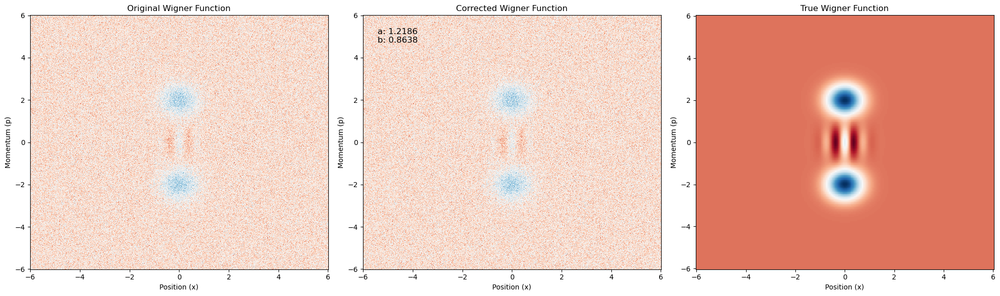

In [97]:
noisy_data_number = 2
with open(synthetic_data_path + "/noisy_wigner_" + str(noisy_data_number) + ".pickle", 'rb') as read:
	wigner_function = pickle.load(read)
with open(synthetic_data_path + "/quantum_state_" + str(noisy_data_number) + ".pickle", 'rb') as read:
	quantum_state = pickle.load(read)
     
xvec, yvec, W = wigner_function
xvec_true, yvec_true, W_true = dq.wigner(quantum_state)

def crop_to_finite(W, xvec, yvec):
    """
    Crops W, xvec, yvec to the minimal rectangle containing only finite values in W.
    
    Returns:
        W_cropped, xvec_cropped, yvec_cropped
    """
    mask = np.isfinite(W)
    rows = np.any(mask, axis=1)
    cols = np.any(mask, axis=0)

    row_min, row_max = np.where(rows)[0][[0, -1]]
    col_min, col_max = np.where(cols)[0][[0, -1]]

    W_cropped = W[row_min:row_max+1, col_min:col_max+1]
    xvec_cropped = xvec[col_min:col_max+1]
    yvec_cropped = yvec[row_min:row_max+1]

    return W_cropped, xvec_cropped, yvec_cropped

def estimate_b_robust(W, edge_width=10):
    """Estimate background offset b using only finite values on the edges."""
    edges = np.concatenate([
        W[:edge_width, :].ravel(),
        W[-edge_width:, :].ravel(),
        W[:, :edge_width].ravel(),
        W[:, -edge_width:].ravel()
    ])
    finite_edges = edges[np.isfinite(edges)]  # remove NaN, inf
    return np.mean(finite_edges)

def correct_affine_wigner(W, xvec, yvec, edge_width=10):
    """
    Corrects affine distortion in a Wigner function.

    Parameters:
    - W: 2D numpy array (Wigner function)
    - xvec, yvec: 1D arrays defining the phase space grid
    - edge_width: width of the boundary region for estimating b

    Returns:
    - W_corrected: 2D corrected Wigner function
    - a: normalization factor
    - b: background offset
    """
    dx = xvec[1] - xvec[0]
    dp = yvec[1] - yvec[0]

    # Estimate b from edge values
    b = estimate_b_robust(W, edge_width)

    # Estimate a from integral of (W - b)
    W_masked = np.where(np.isfinite(W), W, 0.0)  # zero out NaNs
    a = np.sum(W_masked - b) * dx * dp
    W_corrected = (W_masked - b) / a

    return W_corrected, a, b

def plot_wigner(W, xvec, yvec, title="Wigner Function", cmap='RdBu'):
    """
    Plots the Wigner function.

    Parameters:
    - W: 2D numpy array (Wigner function)
    - xvec, yvec: 1D arrays defining the phase space grid
    - title: Title of the plot
    - cmap: Colormap for the plot
    """
    X, Y = np.meshgrid(xvec, yvec)
    plt.figure(figsize=(8, 6))
    plt.pcolormesh(X, Y, W, shading='auto', cmap=cmap)
    plt.colorbar(label='Wigner Function Value')
    plt.title(title)
    plt.xlabel('Position (x)')
    plt.ylabel('Momentum (p)')
    plt.grid(True, alpha=0.3)
    plt.show()

# Crop the Wigner function to the finite region
W, xvec, yvec = crop_to_finite(W, xvec, yvec)
# Correct the Wigner function
W_corrected, a, b = correct_affine_wigner(W, xvec, yvec)
# Normalize the Wigner function
dx = xvec[1] - xvec[0]
dp = yvec[1] - yvec[0]
W_corrected /= np.sum(W_corrected) * dx * dp
# Plot the corrected Wigner function, the original Wigner function, the true one as subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 6))
axs[0].pcolormesh(xvec, yvec, W, shading='auto', cmap='RdBu')
axs[0].set_title('Original Wigner Function')
axs[0].set_xlabel('Position (x)')
axs[0].set_ylabel('Momentum (p)')
axs[1].pcolormesh(xvec, yvec, W_corrected, shading='auto', cmap='RdBu')
axs[1].set_title('Corrected Wigner Function')
axs[1].set_xlabel('Position (x)')
axs[1].set_ylabel('Momentum (p)')
axs[1].text(0.05, 0.95, f'a: {a:.4f}\nb: {b:.4f}', fontsize=12, ha='left', va='top', transform=axs[1].transAxes)
axs[2].pcolormesh(xvec_true, yvec_true, W_true, shading='auto', cmap='RdBu')
axs[2].set_title('True Wigner Function')
axs[2].set_xlabel('Position (x)')
axs[2].set_ylabel('Momentum (p)')
plt.tight_layout()
plt.show()

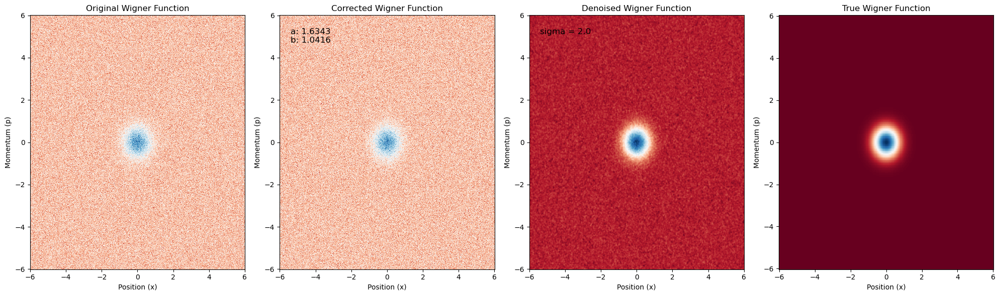

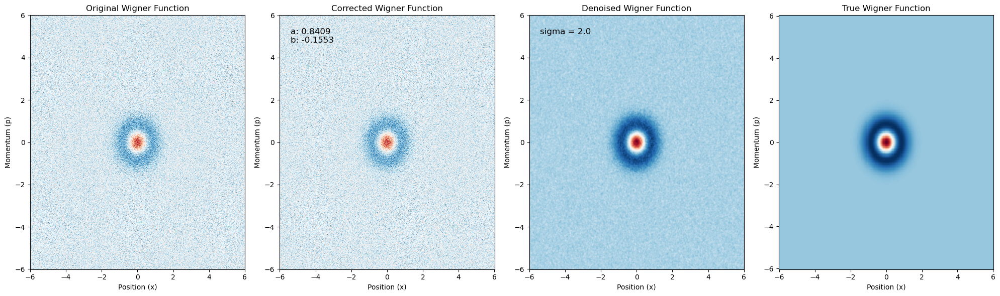

In [ ]:
indices = [0, 1, 2, 3, 4, 5, 6, 7]
for i in indices:
    with open(synthetic_data_path + "/noisy_wigner_" + str(i) + ".pickle", 'rb') as read:
        wigner_function = pickle.load(read)
    with open(synthetic_data_path + "/quantum_state_" + str(i) + ".pickle", 'rb') as read:
        quantum_state = pickle.load(read)
         
    xvec, yvec, W = wigner_function
    xvec_true, yvec_true, W_true = dq.wigner(quantum_state)

    # Crop the Wigner function to the finite region
    W, xvec, yvec = crop_to_finite(W, xvec, yvec)

    # Correct the Wigner function
    W_corrected, a, b = correct_affine_wigner(W, xvec, yvec)
    # Normalize the Wigner function
    dx = xvec[1] - xvec[0]
    dp = yvec[1] - yvec[0]
    W_corrected /= np.sum(W_corrected) * dx * dp
    # Plot the corrected Wigner function, the original Wigner function, the true one as subplots, and third one is the denoised corrected Wigner 
    sigma = 2.0
    W_denoised = denoise_wigner(W_corrected, sigma=sigma)
    fig, axs = plt.subplots(1, 4, figsize=(20, 6))
    axs[0].pcolormesh(xvec, yvec, W, shading='auto', cmap='RdBu')
    axs[0].set_title('Original Wigner Function')
    axs[0].set_xlabel('Position (x)')
    axs[0].set_ylabel('Momentum (p)')
    axs[1].pcolormesh(xvec, yvec, W_corrected, shading='auto', cmap='RdBu')
    axs[1].set_title('Corrected Wigner Function')
    axs[1].set_xlabel('Position (x)')
    axs[1].set_ylabel('Momentum (p)')
    axs[1].text(0.05, 0.95, f'a: {a:.4f}\nb: {b:.4f}', fontsize=12, ha='left', va='top', transform=axs[1].transAxes)
    axs[2].pcolormesh(xvec, yvec, W_denoised, shading='auto', cmap='RdBu')
    axs[2].set_title('Denoised Wigner Function')
    axs[2].set_xlabel('Position (x)')
    axs[2].set_ylabel('Momentum (p)')
    axs[2].text(0.05, 0.95, f'sigma = {sigma}', fontsize=12, ha='left', va='top', transform=axs[2].transAxes)
    axs[3].pcolormesh(xvec_true, yvec_true, W_true, shading='auto', cmap='RdBu')
    axs[3].set_title('True Wigner Function')
    axs[3].set_xlabel('Position (x)')
    axs[3].set_ylabel('Momentum (p)')
    plt.tight_layout()
    plt.show()

In [ ]:
#Now the ones without a true wigner function
indices = [8, 9, 10, 11, 12, 13, 14, 15]
for i in indices:
    with open(synthetic_data_path + "/noisy_wigner_" + str(i) + ".pickle", 'rb') as read:
        wigner_function = pickle.load(read)
    # with open(synthetic_data_path + "/quantum_state_" + str(i) + ".pickle", 'rb') as read:
    #     quantum_state = pickle.load(read)
         
    xvec, yvec, W = wigner_function
    xvec_true, yvec_true, W_true = dq.wigner(quantum_state)

    # Crop the Wigner function to the finite region
    W, xvec, yvec = crop_to_finite(W, xvec, yvec)
    # Correct the Wigner function
    W_corrected, a, b = correct_affine_wigner(W, xvec, yvec)
    # Normalize the Wigner function
    dx = xvec[1] - xvec[0]
    dp = yvec[1] - yvec[0]
    W_corrected /= np.sum(W_corrected) * dx * dp
    # Plot the corrected Wigner function, the original Wigner function, the true one as subplots
    sigma = 2.0
    W_denoised = denoise_wigner(W_corrected, sigma=sigma)
    fig, axs = plt.subplots(1, 4, figsize=(20, 6))
    axs[0].pcolormesh(xvec, yvec, W, shading='auto', cmap='RdBu')
    axs[0].set_title('Original Wigner Function')
    axs[0].set_xlabel('Position (x)')
    axs[0].set_ylabel('Momentum (p)')
    axs[1].pcolormesh(xvec, yvec, W_corrected, shading='auto', cmap='RdBu')
    axs[1].set_title('Corrected Wigner Function')
    axs[1].set_xlabel('Position (x)')
    axs[1].set_ylabel('Momentum (p)')
    axs[1].text(0.05, 0.95, f'a: {a:.4f}\nb: {b:.4f}', fontsize=12, ha='left', va='top', transform=axs[1].transAxes)
    axs[2].pcolormesh(xvec, yvec, W_denoised, shading='auto', cmap='RdBu')
    axs[2].set_title('Denoised Wigner Function')
    axs[2].set_xlabel('Position (x)')
    axs[2].set_ylabel('Momentum (p)')
    axs[2].text(0.05, 0.95, f'sigma = {sigma}', fontsize=12, ha='left', va='top', transform=axs[2].transAxes)
    # axs[2].pcolormesh(xvec_true, yvec_true, W_true, shading='auto', cmap='RdBu')
    # axs[2].set_title('True Wigner Function')
    # axs[2].set_xlabel('Position (x)')
    # axs[2].set_ylabel('Momentum (p)')
    plt.tight_layout()
    plt.show()

NameError: name 'crop_to_finite' is not defined